# **Predict Ultimate Incurred Claim Cost**
#### **Classifying Complex Claim using machine learning**

Task: To prepare a presentation to showcase the findings and walk through the analysis of Insurance Claim Cost



# **Pace: Plan**

 **Define Objectives:**

 - Improve accuracy and consistency of cost estimates.

 - Identify complex claims early for proper triage.

**Project Scope:**
 
 - Develop predictive model for cost estimation.
 
 - Create classification model for early identification of complex claims.

**The problem trying to solve with the regression model:**

- The regression model aims to predict the `UltimateIncurredClaimCost`. Accurate prediction of this cost is crucial as it impacts the financial reserves of the company, allowing for better financial planning and resource allocation.

**The objective of the classification model**

- The classification model seeks to identify complex claims early in the process.  By classifying these complex claims, the model helps ensure that they are triaged to the appropriate claims handlers who are better equipped to manage them.

**Success criteria for each model**

- For resgression models the success criteria is R-square score and for the classification models the success criteria is F1 score


### **Imports and data loading**

Start by importing packages needed to build machine learning models to achieve the goal of this project.

In [1]:
# Import packages for data manipulation
import pandas as pd
import numpy as np

# Import packages for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Import packages for data modeling
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error as MAPE

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression,LogisticRegression
from xgboost import XGBClassifier, XGBRegressor, plot_importance

import shap 
from sklearnex import patch_sklearn
patch_sklearn()

import warnings
warnings.filterwarnings('ignore')
pd.set_option("display.max_columns", None)


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
df = pd.read_csv('data.csv', parse_dates=['DateTimeOfAccident', 'DateReported'])

#### Load dataset

In [3]:
df.head(3)

,ClaimNumber,DateTimeOfAccident,DateReported,Age,Gender,MaritalStatus,DependentChildren,DependentsOther,WeeklyWages,PartTimeFullTime,HoursWorkedPerWeek,DaysWorkedPerWeek,ClaimDescriptionKeyword_0,ClaimDescriptionKeyword_1,ClaimDescriptionKeyword_2,ClaimDescriptionKeyword_3,ClaimDescriptionKeyword_4,ClaimDescriptionKeyword_5,ClaimDescriptionKeyword_6,ClaimDescriptionKeyword_7,ClaimDescriptionKeyword_8,ClaimDescriptionKeyword_9,ClaimDescriptionKeyword_10,ClaimDescriptionKeyword_11,InitialIncurredClaimsCost,UltimateIncurredClaimCost
0,WC8285054,2002-04-09 07:00:00+00:00,2002-07-05 00:00:00+00:00,48,M,M,0,0,500.00,F,38.0,5,2.254325,-1.466085,-1.278155,-0.422165,-0.137039,1.634239,-1.436096,-0.757871,-1.091920,0.880767,0.168497,1.161294,1500,4748.203388
1,WC6982224,1999-01-07 11:00:00+00:00,1999-01-20 00:00:00+00:00,43,F,M,0,0,509.34,F,37.5,5,2.356002,-1.259903,1.490410,-0.818467,1.788994,0.459482,0.662757,-0.240500,-0.162451,0.665242,0.844019,-1.305332,5500,6326.285819
2,WC5481426,1996-03-25 00:00:00+00:00,1996-04-14 00:00:00+00:00,30,M,U,0,0,709.10,F,38.0,5,0.817685,-1.088115,1.520340,-0.233031,-0.045712,-0.192742,-0.047881,0.139051,-0.339551,-0.386420,-0.397919,-0.259750,1700,2293.949087


# pAce: Analyze Stage
- Understand variables
- Clean dataset (missing data, redundant data, outliers) 
- Perform EDA (analyze relationships between variables) 

## Data Exploration (EDA and data cleaning)

### Gather basic information about the data

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 54000 entries, 0 to 53999

Data columns (total 26 columns):

 #   Column                      Non-Null Count  Dtype              

---  ------                      --------------  -----              

 0   ClaimNumber                 54000 non-null  object             

 1   DateTimeOfAccident          54000 non-null  datetime64[ns, UTC]

 2   DateReported                54000 non-null  datetime64[ns, UTC]

 3   Age                         54000 non-null  int64              

 4   Gender                      54000 non-null  object             

 5   MaritalStatus               53971 non-null  object             

 6   DependentChildren           54000 non-null  int64              

 7   DependentsOther             54000 non-null  int64              

 8   WeeklyWages                 54000 non-null  float64            

 9   PartTimeFullTime            54000 non-null  object             

 10  HoursWorkedPerWeek          54000 non-null 

**This dataset has the following info:**
1. 54000 data examples
2. overall 25 features
3. 2 datetime features
4. 3 categorical features
5. 1 identifier features
6. 19 numerical features

### Gather descriptive statistics about the data

In [5]:
df.describe(include="object")

,ClaimNumber,Gender,MaritalStatus,PartTimeFullTime
count,54000,54000,53971,54000
unique,54000,3,3,2
top,WC8285054,M,S,F
freq,1,41660,26161,49112


In [6]:
df.describe().round(2)

,Age,DependentChildren,DependentsOther,WeeklyWages,HoursWorkedPerWeek,DaysWorkedPerWeek,ClaimDescriptionKeyword_0,ClaimDescriptionKeyword_1,ClaimDescriptionKeyword_2,ClaimDescriptionKeyword_3,ClaimDescriptionKeyword_4,ClaimDescriptionKeyword_5,ClaimDescriptionKeyword_6,ClaimDescriptionKeyword_7,ClaimDescriptionKeyword_8,ClaimDescriptionKeyword_9,ClaimDescriptionKeyword_10,ClaimDescriptionKeyword_11,InitialIncurredClaimsCost,UltimateIncurredClaimCost
count,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00,54000.00
mean,33.84,0.12,0.01,416.36,37.74,4.91,2.35,-0.40,0.01,-0.05,-0.01,0.09,0.06,0.01,-0.02,-0.01,0.04,0.07,7841.15,11003.37
std,12.12,0.52,0.11,248.64,12.57,0.55,1.10,1.73,1.52,1.12,1.05,0.94,0.93,0.85,0.79,0.72,0.70,0.66,20584.08,33390.99
min,13.00,0.00,0.00,1.00,0.00,1.00,0.02,-4.61,-4.34,-3.11,-4.25,-3.68,-3.36,-3.26,-2.55,-2.83,-3.25,-2.44,1.00,121.89
25%,23.00,0.00,0.00,200.00,38.00,5.00,1.58,-1.65,-1.20,-0.80,-0.62,-0.55,-0.52,-0.59,-0.53,-0.48,-0.41,-0.34,700.00,926.34
50%,32.00,0.00,0.00,392.20,38.00,5.00,2.20,-0.91,-0.02,-0.16,-0.07,0.07,-0.01,-0.04,-0.09,-0.03,-0.01,0.02,2000.00,3371.24
75%,43.00,0.00,0.00,500.00,40.00,5.00,3.00,0.57,1.33,0.60,0.56,0.68,0.59,0.54,0.42,0.43,0.46,0.40,9500.00,8197.25
max,81.00,9.00,5.00,7497.00,640.00,7.00,6.56,5.12,4.92,5.14,4.49,3.79,4.26,3.40,3.64,3.10,3.52,3.44,2000000.00,4027135.94


In the `HoursWorkedPerWeek` there are more worked hours than in a week, which is impossible

### Understanding Varibales

In [7]:
# consider that employee can work 18 hours a day, 7 days a week, more than that is impossible.
# replacing hours greater than maximum work hours in week with the median hours for employee.
max_work_per_week = 18*7 # 18 hours * 7 days
df['HoursWorkedPerWeek'][df.HoursWorkedPerWeek > max_work_per_week] = df.HoursWorkedPerWeek.median()

In [8]:
df.DependentChildren.unique(), df.DependentChildren.value_counts()

(array([0, 3, 1, 2, 5, 9, 4, 6, 8]),
 DependentChildren
 0    50639
 2     1361
 1     1273
 3      528
 4      150
 5       42
 6        5
 9        1
 8        1
 Name: count, dtype: int64)

In [9]:
df.DependentsOther.unique(), df.DependentsOther.value_counts()

(array([0, 1, 2, 3, 5]),
 DependentsOther
 0    53506
 1      462
 2       23
 3        8
 5        1
 Name: count, dtype: int64)

In [10]:
df.Gender.unique(), df.Gender.value_counts()

(array(['M', 'F', 'U'], dtype=object),
 Gender
 M    41660
 F    12338
 U        2
 Name: count, dtype: int64)

In [11]:
# removing unkown `Gender` which only appears twice in the dataset.
df = df[df.Gender != 'U']

In [12]:
df.MaritalStatus.unique(), df.MaritalStatus.value_counts()

(array(['M', 'U', 'S', nan], dtype=object),
 MaritalStatus
 S    26161
 M    22514
 U     5294
 Name: count, dtype: int64)

### Check missing values

In [13]:
# Check for missing values
df.isna().sum()

ClaimNumber                    0
DateTimeOfAccident             0
DateReported                   0
Age                            0
Gender                         0
MaritalStatus                 29
DependentChildren              0
DependentsOther                0
WeeklyWages                    0
PartTimeFullTime               0
HoursWorkedPerWeek             0
DaysWorkedPerWeek              0
ClaimDescriptionKeyword_0      0
ClaimDescriptionKeyword_1      0
ClaimDescriptionKeyword_2      0
ClaimDescriptionKeyword_3      0
ClaimDescriptionKeyword_4      0
ClaimDescriptionKeyword_5      0
ClaimDescriptionKeyword_6      0
ClaimDescriptionKeyword_7      0
ClaimDescriptionKeyword_8      0
ClaimDescriptionKeyword_9      0
ClaimDescriptionKeyword_10     0
ClaimDescriptionKeyword_11     0
InitialIncurredClaimsCost      0
UltimateIncurredClaimCost      0
dtype: int64

There are 29 missing values in the `Marital Status` .

In [14]:
# unique values of the Marital Status
df.MaritalStatus.unique()

array(['M', 'U', 'S', nan], dtype=object)

In [15]:
# filling nan Marital Status with U (Unknown) values
df.MaritalStatus.fillna('U',inplace=True)

### Check duplicates

In [16]:
# Check for duplicates
df.duplicated().sum()

0

There are no duplicates values in the data.

### checking outliers

The descriptive statistics above shows that there are outliers in the following variables. 
`'WeeklyWages','HoursWorkedPerWeek','InitialIncurredClaimsCost', and 'UltimateIncurredClaimCost'`

It would be helpful to investigate how many rows in the data contain outliers in these columns.

In [17]:
# Determine the number of rows containing outliers 
def data_outliers(df,col,replace=False,verbose=False):

    # Compute the 25th percentile value in column
    percentile25 = df[col].quantile(0.25)

    # Compute the 75th percentile value in column
    percentile75 = df[col].quantile(0.75)

    # Compute the interquartile range in column
    iqr = percentile75 - percentile25

    # Define the upper limit and lower limit for non-outlier values in column
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr

    # Identify subset of data containing outliers in column
    outliers = df[(df[col] > upper_limit) | (df[col] < lower_limit)]

    if verbose:
        print(f"Lower limit: {lower_limit:.2f}")
        print(f"Upper limit: {upper_limit:.2f}")
        print(f"Number of rows in the data containing outliers in {col}:", len(outliers))
        print('Stats:',df.describe()[col].round(2).to_dict())

    if replace:
        df[col][df[col] > upper_limit] = upper_limit
        df[col][df[col] < lower_limit] = lower_limit

In [18]:
cont_columns = df.select_dtypes(include=[float]).columns

-------------------------------------------------- WeeklyWages --------------------------------------------------


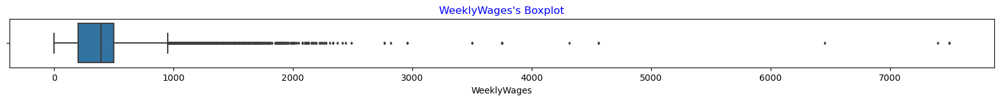

Lower limit: -250.00

Upper limit: 950.00

Number of rows in the data containing outliers in WeeklyWages: 1478

Stats: {'count': 53998.0, 'mean': 416.36, 'std': 248.64, 'min': 1.0, '25%': 200.0, '50%': 392.2, '75%': 500.0, 'max': 7497.0}


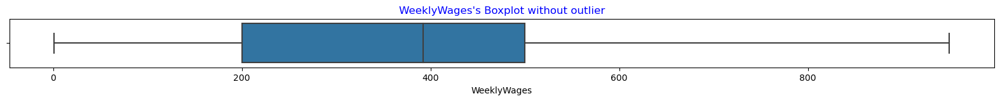

-------------------------------------------------- InitialIncurredClaimsCost --------------------------------------------------


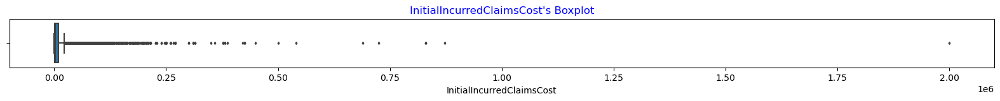

Lower limit: -12500.00

Upper limit: 22700.00

Number of rows in the data containing outliers in InitialIncurredClaimsCost: 4355

Stats: {'count': 53998.0, 'mean': 7841.28, 'std': 20584.43, 'min': 1.0, '25%': 700.0, '50%': 2000.0, '75%': 9500.0, 'max': 2000000.0}


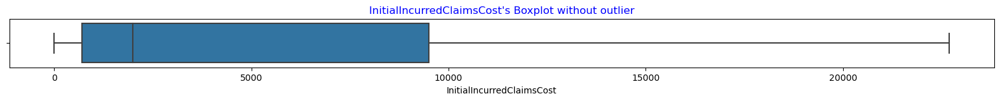

-------------------------------------------------- UltimateIncurredClaimCost --------------------------------------------------


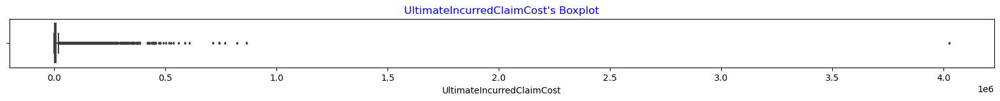

Lower limit: -9979.91

Upper limit: 19103.30

Number of rows in the data containing outliers in UltimateIncurredClaimCost: 6805

Stats: {'count': 53998.0, 'mean': 11003.55, 'std': 33391.59, 'min': 121.89, '25%': 926.3, '50%': 3371.24, '75%': 8197.1, 'max': 4027135.94}


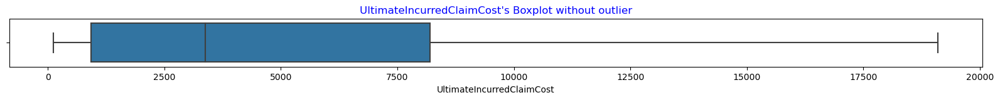

In [19]:
# Create a boxplot to visualize distribution of 'WeeklyWages','HoursWorkedPerWeek',
#'InitialIncurredClaimsCost', and 'UltimateIncurredClaimCost' and detect any outliers
columns = ['WeeklyWages','InitialIncurredClaimsCost','UltimateIncurredClaimCost']
for col in columns:
    print('-'*50,col,'-'*50)
    plt.figure(figsize=(20,1))
    plt.title(f"{col}'s Boxplot",{'color':'b'})
    sns.boxplot(x=df[col],fliersize=2)
    plt.show()

    data_outliers(df,col,replace=True,verbose=True)
    plt.figure(figsize=(20,1))
    plt.title(f"{col}'s Boxplot without outlier", {'color':'b'})
    sns.boxplot(x=df[col],fliersize=2)
    plt.show()

### Features Engineering

In [20]:
df['HourlyWages'] = df['WeeklyWages'] / np.clip(df['HoursWorkedPerWeek'],1,np.inf)

In [21]:
df['ReportLeadDays']=np.clip((df['DateReported'] - df['DateTimeOfAccident']).dt.days,0,np.inf)

In [22]:
df.PartTimeFullTime = df.PartTimeFullTime.map({'P':'PartTime','F':'FullTime'})
df.Gender = df.Gender.map({'M':'Male','F':'Female'})

df.MaritalStatus = df.MaritalStatus.map({'M':'Married','S':'Single','U':'Unknown'})
df['GenderMaritalStatus'] = df.Gender+' '+df.MaritalStatus

In [23]:
df['TotalDependent'] = df['DependentChildren'] + df['DependentsOther']

In [24]:
df['WeekDayOfAccident']=df['DateTimeOfAccident'].dt.day_of_week
df['MonthOfAccident']=df['DateTimeOfAccident'].dt.month
df['HourOfAccident']=df['DateTimeOfAccident'].dt.hour

Selected Threshold for Complex Claims: 1015.1479899999995


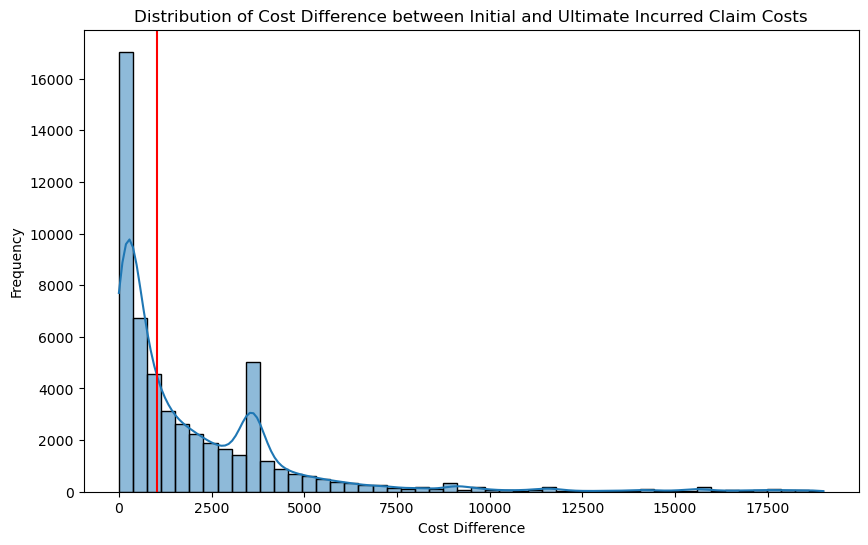

In [25]:
# Calculate the absolute difference between InitialIncurredClaimsCost and UltimateIncurredClaimCost
df['CostDifference'] = (df['InitialIncurredClaimsCost'] - df['UltimateIncurredClaimCost']).abs()


# Determine the threshold for complex claims (e.g., 50th percentile)
threshold = df['CostDifference'].median()
print(f'Selected Threshold for Complex Claims: {threshold}')
# Define complex claims based on the selected threshold
df['ComplexClaim'] = (df['CostDifference'] > threshold).astype(int)

# Plot the distribution of CostDifference
plt.figure(figsize=(10, 6))
sns.histplot(df['CostDifference'], bins=50, kde=True)
plt.title('Distribution of Cost Difference between Initial and Ultimate Incurred Claim Costs')
plt.xlabel('Cost Difference')
plt.ylabel('Frequency')
plt.axvline(threshold, color='r')
plt.show()

In [26]:
df.head(5)

,ClaimNumber,DateTimeOfAccident,DateReported,Age,Gender,MaritalStatus,DependentChildren,DependentsOther,WeeklyWages,PartTimeFullTime,HoursWorkedPerWeek,DaysWorkedPerWeek,ClaimDescriptionKeyword_0,ClaimDescriptionKeyword_1,ClaimDescriptionKeyword_2,ClaimDescriptionKeyword_3,ClaimDescriptionKeyword_4,ClaimDescriptionKeyword_5,ClaimDescriptionKeyword_6,ClaimDescriptionKeyword_7,ClaimDescriptionKeyword_8,ClaimDescriptionKeyword_9,ClaimDescriptionKeyword_10,ClaimDescriptionKeyword_11,InitialIncurredClaimsCost,UltimateIncurredClaimCost,HourlyWages,ReportLeadDays,GenderMaritalStatus,TotalDependent,WeekDayOfAccident,MonthOfAccident,HourOfAccident,CostDifference,ComplexClaim
0,WC8285054,2002-04-09 07:00:00+00:00,2002-07-05 00:00:00+00:00,48,Male,Married,0,0,500.00,FullTime,38.0,5,2.254325,-1.466085,-1.278155,-0.422165,-0.137039,1.634239,-1.436096,-0.757871,-1.091920,0.880767,0.168497,1.161294,1500,4748.203388,13.157895,86,Male Married,0,1,4,7,3248.203388,1
1,WC6982224,1999-01-07 11:00:00+00:00,1999-01-20 00:00:00+00:00,43,Female,Married,0,0,509.34,FullTime,37.5,5,2.356002,-1.259903,1.490410,-0.818467,1.788994,0.459482,0.662757,-0.240500,-0.162451,0.665242,0.844019,-1.305332,5500,6326.285819,13.582400,12,Female Married,0,3,1,11,826.285819,0
2,WC5481426,1996-03-25 00:00:00+00:00,1996-04-14 00:00:00+00:00,30,Male,Unknown,0,0,709.10,FullTime,38.0,5,0.817685,-1.088115,1.520340,-0.233031,-0.045712,-0.192742,-0.047881,0.139051,-0.339551,-0.386420,-0.397919,-0.259750,1700,2293.949087,18.660526,20,Male Unknown,0,0,3,0,593.949087,0
3,WC9775968,2005-06-22 13:00:00+00:00,2005-07-22 00:00:00+00:00,41,Male,Single,0,0,555.46,FullTime,38.0,5,4.022864,3.184172,-0.014604,1.219356,0.067053,1.105471,0.609462,1.495272,-0.527257,-0.187209,-0.857031,-0.343594,15000,17786.487170,14.617368,29,Male Single,0,2,6,13,2786.487170,1
4,WC2634037,1990-08-29 08:00:00+00:00,1990-09-27 00:00:00+00:00,36,Male,Married,0,0,377.10,FullTime,38.0,5,3.383056,0.009941,1.691871,-1.390378,-0.647481,-1.413973,-0.807369,0.243139,1.031237,0.366183,0.427945,-0.038234,2800,4014.002925,9.923684,28,Male Married,0,2,8,8,1214.002925,1


### Data visualizations

In [27]:
claim_description_df = df[['ClaimDescriptionKeyword_0',	'ClaimDescriptionKeyword_1',	'ClaimDescriptionKeyword_2',	'ClaimDescriptionKeyword_3',	'ClaimDescriptionKeyword_4',	'ClaimDescriptionKeyword_5',	'ClaimDescriptionKeyword_6',	'ClaimDescriptionKeyword_7',	'ClaimDescriptionKeyword_8',	'ClaimDescriptionKeyword_9',	'ClaimDescriptionKeyword_10',	'ClaimDescriptionKeyword_11']]

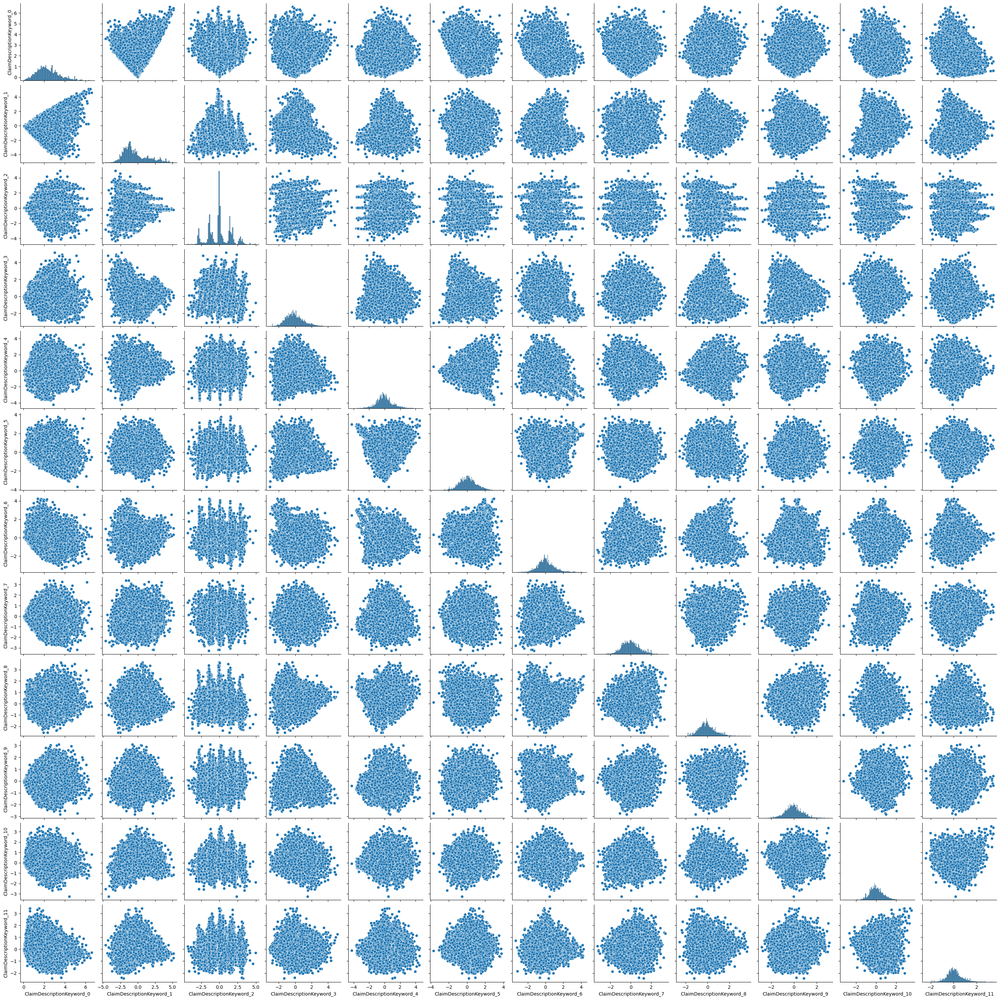

In [28]:
sns.pairplot(claim_description_df)

The `ClaimDescriptionKeywords` are normaly distributed but not linearly related with each other.

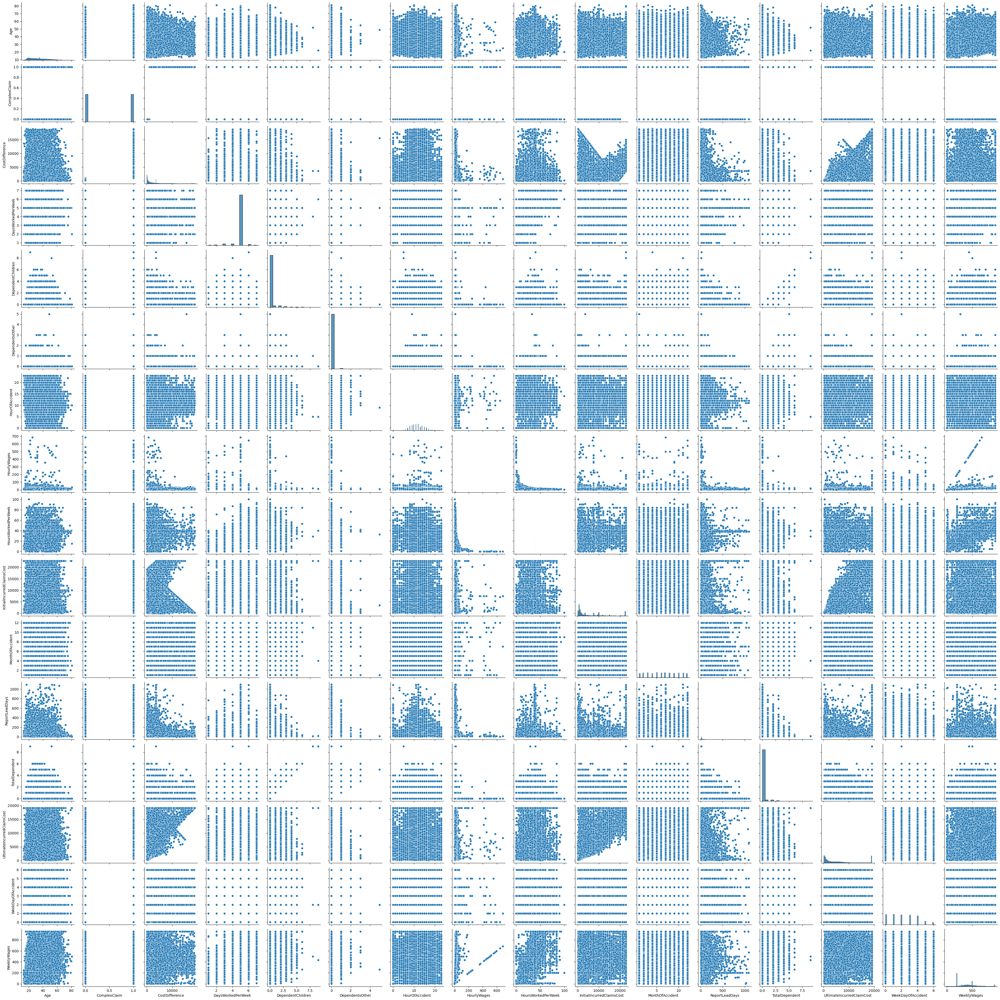

In [29]:
sns.pairplot(df[df.columns.symmetric_difference(claim_description_df.columns)])

The above visualizations shows that the data is neither linearly related nor normaly distributed.

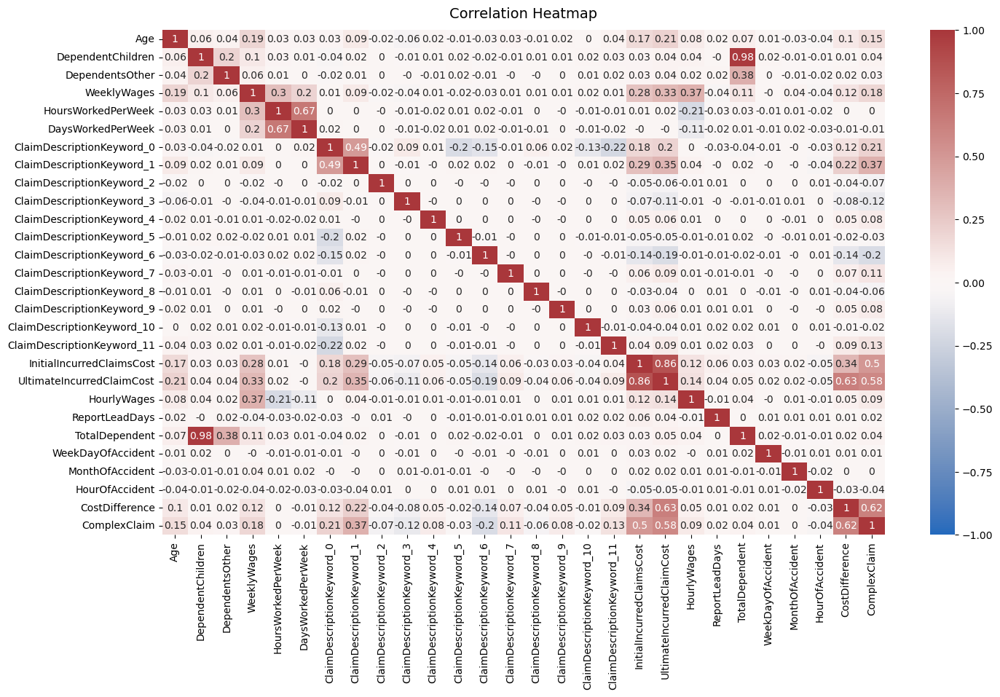

In [30]:
# Plot a correlation heatmap
plt.figure(figsize=(16, 9))
heatmap = sns.heatmap(df.corr(numeric_only=True).round(2), vmin=-1, vmax=1, annot=True, cmap=sns.color_palette("vlag", as_cmap=True))
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=12);

The correlation heatmap shows that only `InitialIncurredClaimCost`  have some positive correlation with `UltimateIncurredClaimCost`.

####  Categorical Data Analysis

Text(0.5, 1.0, 'Count of PartTimeFullTime')

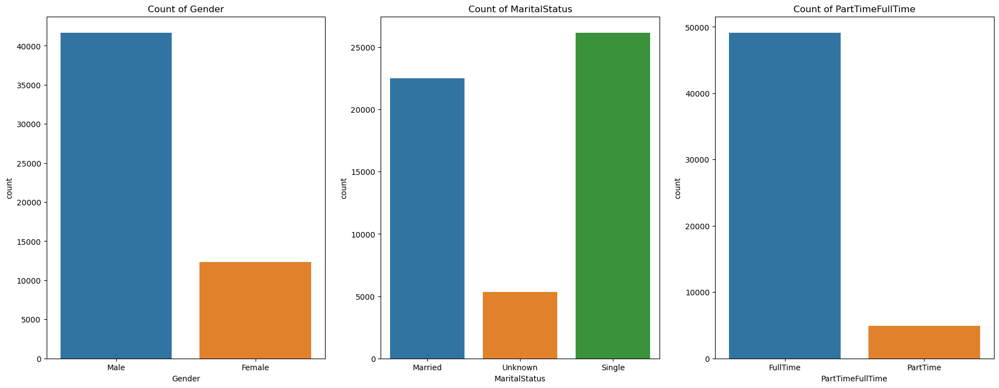

In [31]:
fig, ax = plt.subplots(1, 3, figsize = (22,8))


sns.countplot(data=df, x='Gender', ax=ax[0])
ax[0].set_title('Count of Gender')

sns.countplot(data=df, x='MaritalStatus', ax=ax[1])
ax[1].set_title('Count of MaritalStatus')

sns.countplot(data=df, x='PartTimeFullTime', ax=ax[2])
ax[2].set_title('Count of PartTimeFullTime')

The information from above chart are :

- The insurance policies bearer are mostly Men.
- The insurance policies bearer are mostly Single.
- The insurance policies bearer are mostly works Full Time.


#### Effect of Worker Demographics on Claim Cost


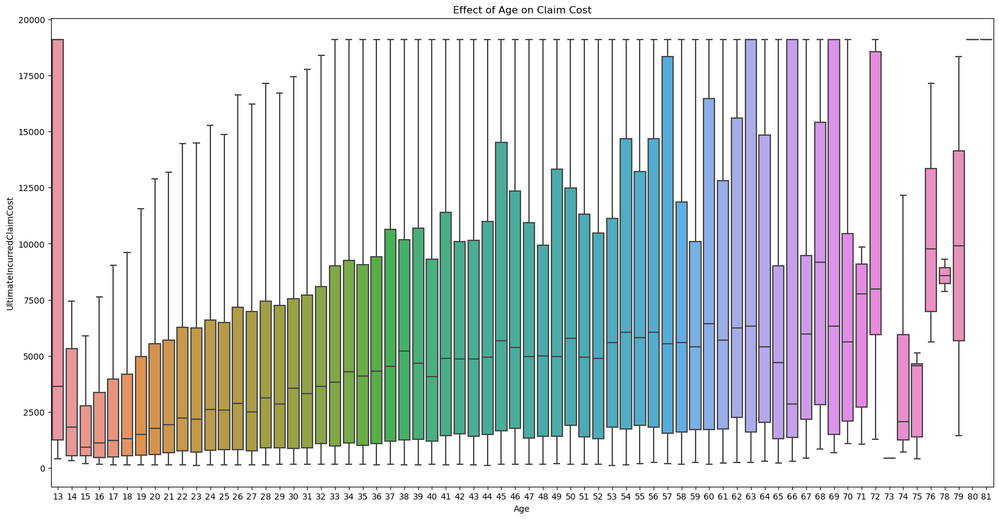

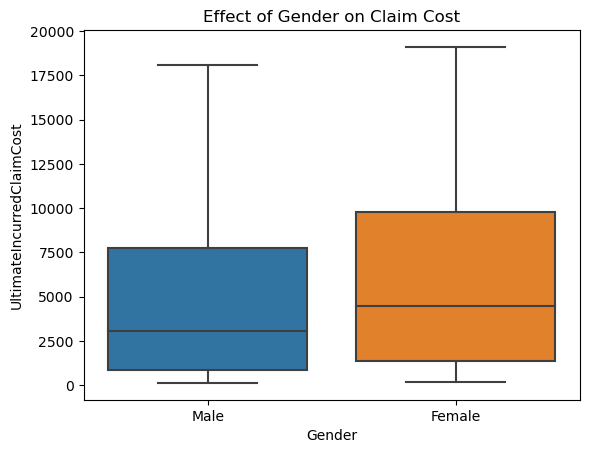

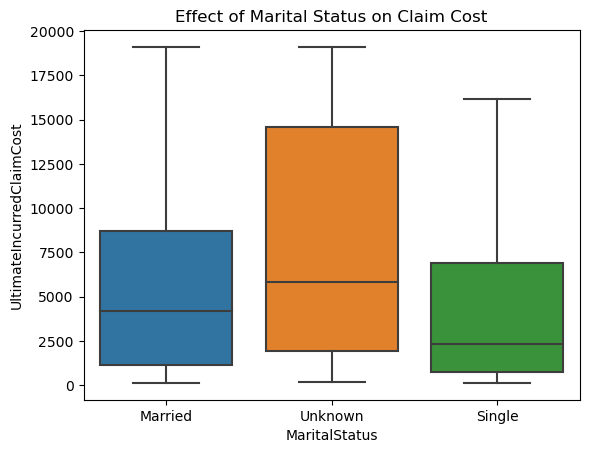

In [32]:
plt.figure(figsize=(20,10))
# Box plot for Age
sns.boxplot(x='Age', y='UltimateIncurredClaimCost', data=df, showfliers=False)
plt.title('Effect of Age on Claim Cost')
plt.show()


# Box plot for Gender
sns.boxplot(x='Gender', y='UltimateIncurredClaimCost', data=df, showfliers=False)
plt.title('Effect of Gender on Claim Cost')
plt.show()

# Box plot for Marital Status
sns.boxplot(x='MaritalStatus', y='UltimateIncurredClaimCost', data=df, showfliers=False)
plt.title('Effect of Marital Status on Claim Cost')
plt.show()


#### Correlation Between Weekly Wages and Claim Cost


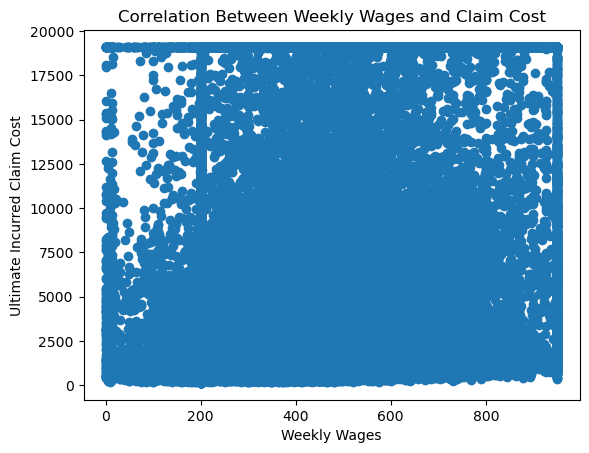

In [33]:
# Scatter plot for Weekly Wages
plt.scatter(df['WeeklyWages'], df['UltimateIncurredClaimCost'])
plt.title('Correlation Between Weekly Wages and Claim Cost')
plt.xlabel('Weekly Wages')
plt.ylabel('Ultimate Incurred Claim Cost')
plt.show()

####  DateTime Data Analysis

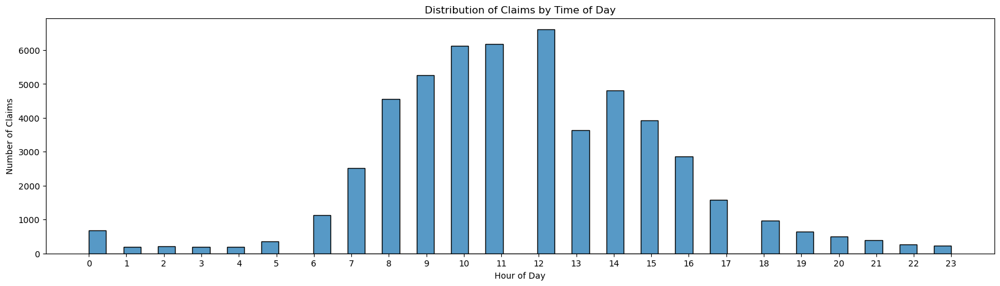

In [34]:
plt.figure(figsize=(20,5))
sns.histplot(df,x=df.HourOfAccident,multiple='dodge',bins=50)
plt.xticks(np.arange(0,24))
plt.title('Distribution of Claims by Time of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Claims')
plt.show()

At 10 to 12 The accidents occurrences are at peak.

1094.0

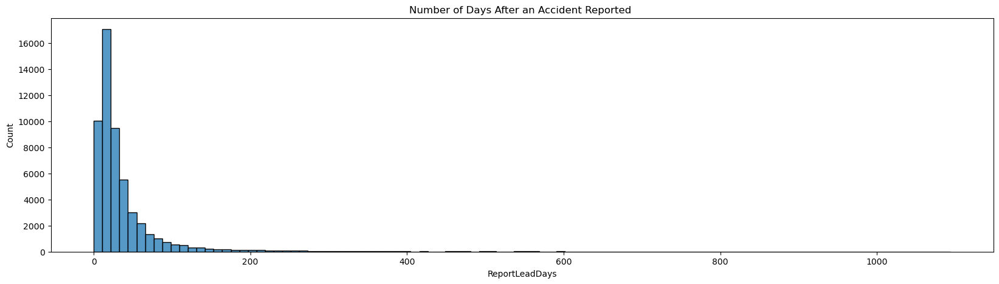

In [35]:
plt.figure(figsize=(20,5))
plt.title('Number of Days After an Accident Reported ')
sns.histplot(df.ReportLeadDays, bins=100)
df.ReportLeadDays.quantile(1)


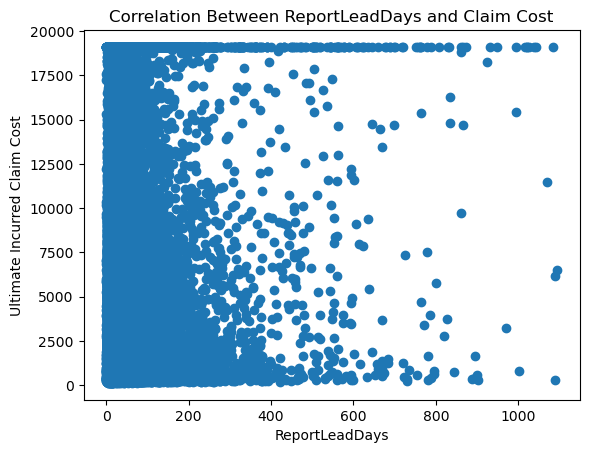

In [36]:
# Scatter plot for Weekly Wages
plt.scatter(df.ReportLeadDays, df['UltimateIncurredClaimCost'])
plt.title('Correlation Between ReportLeadDays and Claim Cost')
plt.xlabel('ReportLeadDays')
plt.ylabel('Ultimate Incurred Claim Cost')
plt.show()

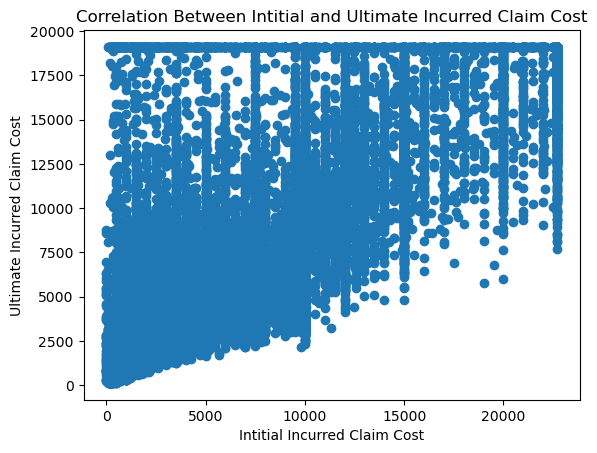

In [37]:
# Scatter plot for Weekly Wages
plt.scatter(x=df['InitialIncurredClaimsCost'], y=df['UltimateIncurredClaimCost'])
plt.title('Correlation Between Intitial and Ultimate Incurred Claim Cost')
plt.xlabel('Intitial Incurred Claim Cost')
plt.ylabel('Ultimate Incurred Claim Cost')
plt.show()

Most of Accidents are reported within 100 days

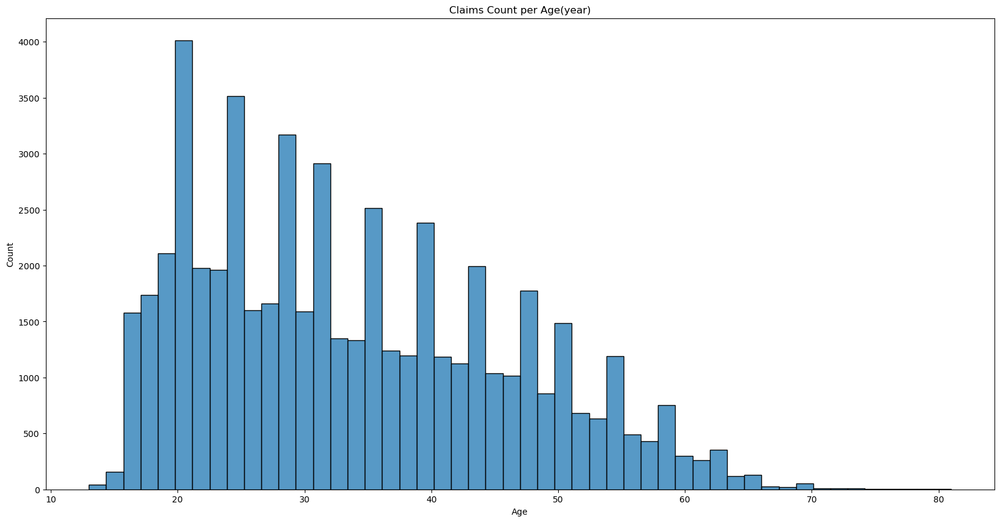

In [38]:
plt.figure(figsize=(20,10))
plt.title('Claims Count per Age(year)')
sns.histplot(x=df.Age,bins=50)
plt.show()

There are more accidents occured within 20 to 30 years old peoples

### Define features and target variable


In [39]:
y = df.UltimateIncurredClaimCost
y_clf = df.ComplexClaim
X = df.drop(columns=['CostDifference','ComplexClaim','UltimateIncurredClaimCost','ClaimNumber','DateTimeOfAccident','DateReported'])
X.head(2)

,Age,Gender,MaritalStatus,DependentChildren,DependentsOther,WeeklyWages,PartTimeFullTime,HoursWorkedPerWeek,DaysWorkedPerWeek,ClaimDescriptionKeyword_0,ClaimDescriptionKeyword_1,ClaimDescriptionKeyword_2,ClaimDescriptionKeyword_3,ClaimDescriptionKeyword_4,ClaimDescriptionKeyword_5,ClaimDescriptionKeyword_6,ClaimDescriptionKeyword_7,ClaimDescriptionKeyword_8,ClaimDescriptionKeyword_9,ClaimDescriptionKeyword_10,ClaimDescriptionKeyword_11,InitialIncurredClaimsCost,HourlyWages,ReportLeadDays,GenderMaritalStatus,TotalDependent,WeekDayOfAccident,MonthOfAccident,HourOfAccident
0,48,Male,Married,0,0,500.00,FullTime,38.0,5,2.254325,-1.466085,-1.278155,-0.422165,-0.137039,1.634239,-1.436096,-0.757871,-1.091920,0.880767,0.168497,1.161294,1500,13.157895,86,Male Married,0,1,4,7
1,43,Female,Married,0,0,509.34,FullTime,37.5,5,2.356002,-1.259903,1.490410,-0.818467,1.788994,0.459482,0.662757,-0.240500,-0.162451,0.665242,0.844019,-1.305332,5500,13.582400,12,Female Married,0,3,1,11


### Encoding Categorical features

In [40]:
X = pd.get_dummies(X,drop_first=True ,prefix="cate",dtype=int)
X.describe()

,Age,DependentChildren,DependentsOther,WeeklyWages,HoursWorkedPerWeek,DaysWorkedPerWeek,ClaimDescriptionKeyword_0,ClaimDescriptionKeyword_1,ClaimDescriptionKeyword_2,ClaimDescriptionKeyword_3,ClaimDescriptionKeyword_4,ClaimDescriptionKeyword_5,ClaimDescriptionKeyword_6,ClaimDescriptionKeyword_7,ClaimDescriptionKeyword_8,ClaimDescriptionKeyword_9,ClaimDescriptionKeyword_10,ClaimDescriptionKeyword_11,InitialIncurredClaimsCost,HourlyWages,ReportLeadDays,TotalDependent,WeekDayOfAccident,MonthOfAccident,HourOfAccident,cate_Male,cate_Single,cate_Unknown,cate_PartTime,cate_Female Single,cate_Female Unknown,cate_Male Married,cate_Male Single,cate_Male Unknown
count,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000
mean,33.842031,0.119190,0.009945,407.007371,37.472147,4.905756,2.352421,-0.396879,0.011613,-0.048501,-0.007231,0.087461,0.063869,0.005788,-0.022124,-0.008313,0.043542,0.067893,5636.252602,11.347033,38.322456,0.129134,2.296622,6.509926,11.577707,0.771510,0.484481,0.098578,0.090522,0.106782,0.020019,0.315252,0.377699,0.078558
std,12.122247,0.517789,0.109350,202.528931,7.007487,0.552139,1.095398,1.733246,1.522846,1.121740,1.050063,0.944740,0.929053,0.847988,0.785419,0.719854,0.695791,0.658414,6854.624209,12.767023,61.112465,0.549907,1.704768,3.401527,3.751285,0.419864,0.499764,0.298097,0.286931,0.308838,0.140067,0.464621,0.484816,0.269051
min,13.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.022171,-4.608015,-4.336630,-3.105727,-4.250462,-3.678798,-3.360141,-3.262596,-2.545581,-2.834524,-3.246543,-2.444543,1.000000,0.014286,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,0.000000,0.000000,200.000000,38.000000,5.000000,1.575222,-1.647148,-1.199572,-0.801824,-0.620841,-0.551931,-0.523282,-0.586395,-0.527257,-0.477770,-0.412450,-0.335148,700.000000,5.714286,13.000000,0.000000,1.000000,4.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,32.000000,0.000000,0.000000,392.200000,38.000000,5.000000,2.202422,-0.909503,-0.021321,-0.160105,-0.073795,0.065852,-0.011992,-0.036147,-0.088841,-0.033139,-0.012551,0.016891,2000.000000,10.570000,21.000000,0.000000,2.000000,7.000000,11.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43.000000,0.000000,0.000000,500.000000,40.000000,5.000000,2.999068,0.567359,1.332271,0.599867,0.559445,0.677067,0.585257,0.537922,0.420868,0.425496,0.463231,0.403220,9500.000000,13.607632,40.000000,0.000000,4.000000,9.000000,14.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,81.000000,9.000000,5.000000,950.000000,100.000000,7.000000,6.561085,5.124885,4.924040,5.139204,4.494944,3.788355,4.259305,3.396818,3.639030,3.101630,3.524424,3.438082,22700.000000,683.600000,1094.000000,9.000000,6.000000,12.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# paCe: Construct Stage

### Splitting Data

In [41]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
X_tr, X_val, y_tr, y_val = train_test_split( X_train, y_train, test_size=0.33, random_state=42)
split_index = [0 if x in X_val.index else -1 for x in X_train.index ]
custom_split= PredefinedSplit(split_index)

## Model training

## Linear regression

In [43]:
def regression_report(actuals,predictions):
    # Calculate and print the performance metrics
    print('R^2:', r2_score(actuals, predictions).round(4))
    print('MAPE:', MAPE(actuals, predictions).round(4))
    print('MAE:', mean_absolute_error(actuals, predictions).round(4))
    print('RMSE:', np.sqrt(mean_squared_error(actuals, predictions)).round(4))


### Scaling Data and Removing Outlier

In [44]:
sc = StandardScaler().fit(X_train)
X_train_scaled = sc.transform(X_train)
X_test_scaled = sc.transform(X_test)

In [45]:
lr = LinearRegression().fit(X_train,y_train)
lr_preds_tr = lr.predict(X_train)
regression_report(y_train,lr_preds_tr)

R^2: 0.7844

MAPE: 0.7142

MAE: 1740.0201

RMSE: 2931.7198


In [46]:
lr_preds = lr.predict(X_test)
regression_report(y_test,lr_preds)

R^2: 0.7754

MAPE: 0.7247

MAE: 1745.4683

RMSE: 2977.0402


In [47]:
features_imp = list(zip(lr.feature_names_in_,lr.coef_))
features_imp

[('Age', 15.104792421533858),
 ('DependentChildren', -50.33765065632835),
 ('DependentsOther', 169.54222841051723),
 ('WeeklyWages', 3.2192868621576367),
 ('HoursWorkedPerWeek', -2.929155144717358),
 ('DaysWorkedPerWeek', -62.24768406701805),
 ('ClaimDescriptionKeyword_0', 109.31365567093414),
 ('ClaimDescriptionKeyword_1', 371.9282769268828),
 ('ClaimDescriptionKeyword_2', -94.03977874504619),
 ('ClaimDescriptionKeyword_3', -287.7948955742076),
 ('ClaimDescriptionKeyword_4', 137.9053706214798),
 ('ClaimDescriptionKeyword_5', -65.44139058751178),
 ('ClaimDescriptionKeyword_6', -452.0119472108511),
 ('ClaimDescriptionKeyword_7', 329.33831227987565),
 ('ClaimDescriptionKeyword_8', -144.04073154491766),
 ('ClaimDescriptionKeyword_9', 316.66419716232645),
 ('ClaimDescriptionKeyword_10', -85.07572544679938),
 ('ClaimDescriptionKeyword_11', 551.0920647127432),
 ('InitialIncurredClaimsCost', 0.7105213676489591),
 ('HourlyWages', 0.9810248732767998),
 ('ReportLeadDays', -0.14391215944765315),


Increasing each unit of feature increase the coefficient of the feature

ex. Increaing 1 years of `Age` will increase 14 in `UltimateIncurredClaimCost`

## XGBoost Regressor

In [48]:
xgb = XGBRegressor()

cv_params = {
    'learning_rate': [0.07, 0.09, 0.1],
    'max_depth': [3, 4, 5],
    'min_child_weight': [0.07,0.1, 0.15],
    'n_estimators': [100, 125,150],
}

In [49]:
xgb_cv = GridSearchCV(xgb,param_grid=cv_params,cv=custom_split)
xgb_cv.fit(X_train,y_train)

GridSearchCV(cv=PredefinedSplit(test_fold=array([ 0,  0, ..., -1, -1])),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    i...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'learning_rate': [0.07, 0.09, 0.1],
                         'max_depth': [3, 4, 5],
                         'min_child_weight': [0.07, 0.1, 0.15],
                         'n_estimators': [100, 125, 150]})

In [50]:
# Predict on the trainig set
reg_y_pred_tr = xgb_cv.best_estimator_.predict(X_train)

# Calculate and print the performance metrics
regression_report(y_train,reg_y_pred_tr)

R^2: 0.8307

MAPE: 0.3956

MAE: 1394.0023

RMSE: 2597.806


In [51]:
# Predict on the test set
reg_y_pred = xgb_cv.best_estimator_.predict(X_test)
regression_report(y_test,reg_y_pred)

R^2: 0.8003

MAPE: 0.4211

MAE: 1491.1471

RMSE: 2806.5809


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

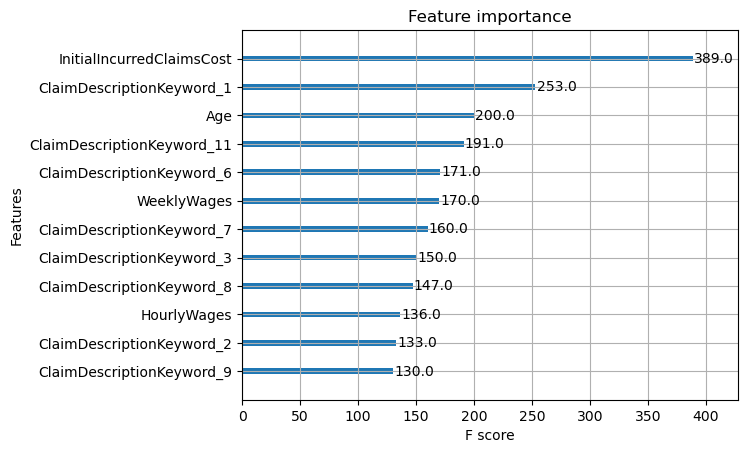

In [52]:
plot_importance(xgb_cv.best_estimator_,max_num_features=12)

### Hyperparameter tuning

In [53]:
xgb_cv.best_params_,cv_params

({'learning_rate': 0.09,
  'max_depth': 5,
  'min_child_weight': 0.07,
  'n_estimators': 100},
 {'learning_rate': [0.07, 0.09, 0.1],
  'max_depth': [3, 4, 5],
  'min_child_weight': [0.07, 0.1, 0.15],
  'n_estimators': [100, 125, 150]})

In [54]:
cv_params =  {
    'learning_rate': [0.06, 0.07, 0.08],
    'max_depth': [4, 5, 6],
    'min_child_weight': [0.01, 0.03, 0.05],
    'n_estimators': [125,150,175],
  }

xgb_cv = GridSearchCV(xgb,param_grid=cv_params,cv=custom_split)

In [55]:
xgb_cv.fit(X_train,y_train)

GridSearchCV(cv=PredefinedSplit(test_fold=array([ 0,  0, ..., -1, -1])),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    i...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'learning_rate': [0.06, 0.07, 0.08],
                         'max_depth': [4, 5, 6],
                         'min_child_weight': [0.01, 0.03, 0.05],
                         'n_estimators': [125, 150, 175]})

In [56]:
xgb_cv.best_score_

0.8176838085348517

In [57]:
xgb_cv.best_params_

{'learning_rate': 0.06,
 'max_depth': 5,
 'min_child_weight': 0.01,
 'n_estimators': 175}

In [58]:
# Predict on the trainig set
reg_y_pred_tr2 = xgb_cv.best_estimator_.predict(X_train)

# Calculate and print the performance metrics
regression_report(y_train,reg_y_pred_tr2)

R^2: 0.8323

MAPE: 0.3931

MAE: 1386.2247

RMSE: 2585.4569


In [59]:
# Predict on the test set
reg_y_pred2 = xgb_cv.best_estimator_.predict(X_test)

# Calculate and print the performance metrics
regression_report(y_test,reg_y_pred2)

R^2: 0.8009

MAPE: 0.4187

MAE: 1488.3839

RMSE: 2802.8432


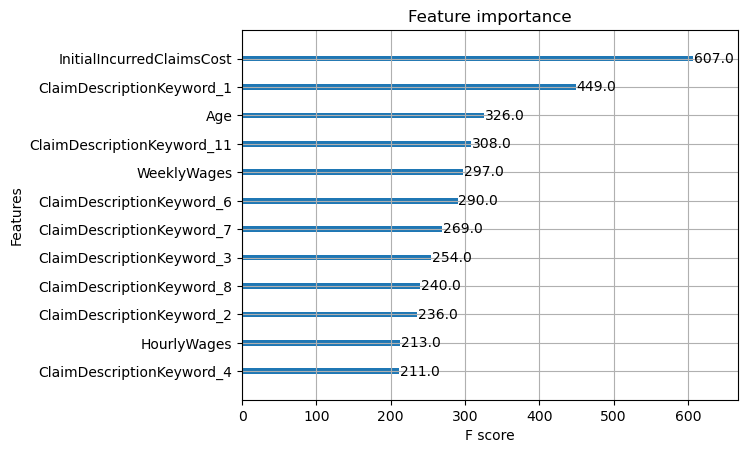

In [60]:
plot_importance(xgb_cv.best_estimator_,max_num_features=12)
plt.show()

## Classification Model

In [61]:
X.describe()

,Age,DependentChildren,DependentsOther,WeeklyWages,HoursWorkedPerWeek,DaysWorkedPerWeek,ClaimDescriptionKeyword_0,ClaimDescriptionKeyword_1,ClaimDescriptionKeyword_2,ClaimDescriptionKeyword_3,ClaimDescriptionKeyword_4,ClaimDescriptionKeyword_5,ClaimDescriptionKeyword_6,ClaimDescriptionKeyword_7,ClaimDescriptionKeyword_8,ClaimDescriptionKeyword_9,ClaimDescriptionKeyword_10,ClaimDescriptionKeyword_11,InitialIncurredClaimsCost,HourlyWages,ReportLeadDays,TotalDependent,WeekDayOfAccident,MonthOfAccident,HourOfAccident,cate_Male,cate_Single,cate_Unknown,cate_PartTime,cate_Female Single,cate_Female Unknown,cate_Male Married,cate_Male Single,cate_Male Unknown
count,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000,53998.000000
mean,33.842031,0.119190,0.009945,407.007371,37.472147,4.905756,2.352421,-0.396879,0.011613,-0.048501,-0.007231,0.087461,0.063869,0.005788,-0.022124,-0.008313,0.043542,0.067893,5636.252602,11.347033,38.322456,0.129134,2.296622,6.509926,11.577707,0.771510,0.484481,0.098578,0.090522,0.106782,0.020019,0.315252,0.377699,0.078558
std,12.122247,0.517789,0.109350,202.528931,7.007487,0.552139,1.095398,1.733246,1.522846,1.121740,1.050063,0.944740,0.929053,0.847988,0.785419,0.719854,0.695791,0.658414,6854.624209,12.767023,61.112465,0.549907,1.704768,3.401527,3.751285,0.419864,0.499764,0.298097,0.286931,0.308838,0.140067,0.464621,0.484816,0.269051
min,13.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.022171,-4.608015,-4.336630,-3.105727,-4.250462,-3.678798,-3.360141,-3.262596,-2.545581,-2.834524,-3.246543,-2.444543,1.000000,0.014286,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,0.000000,0.000000,200.000000,38.000000,5.000000,1.575222,-1.647148,-1.199572,-0.801824,-0.620841,-0.551931,-0.523282,-0.586395,-0.527257,-0.477770,-0.412450,-0.335148,700.000000,5.714286,13.000000,0.000000,1.000000,4.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,32.000000,0.000000,0.000000,392.200000,38.000000,5.000000,2.202422,-0.909503,-0.021321,-0.160105,-0.073795,0.065852,-0.011992,-0.036147,-0.088841,-0.033139,-0.012551,0.016891,2000.000000,10.570000,21.000000,0.000000,2.000000,7.000000,11.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43.000000,0.000000,0.000000,500.000000,40.000000,5.000000,2.999068,0.567359,1.332271,0.599867,0.559445,0.677067,0.585257,0.537922,0.420868,0.425496,0.463231,0.403220,9500.000000,13.607632,40.000000,0.000000,4.000000,9.000000,14.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,81.000000,9.000000,5.000000,950.000000,100.000000,7.000000,6.561085,5.124885,4.924040,5.139204,4.494944,3.788355,4.259305,3.396818,3.639030,3.101630,3.524424,3.438082,22700.000000,683.600000,1094.000000,9.000000,6.000000,12.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Experimentig Kmeans on  `ClaimsDescription`

In [62]:
from sklearn.cluster import KMeans

kmeans = KMeans(2,random_state=42)
kmeans.fit(claim_description_df)

KMeans(n_clusters=2, random_state=42)

In [63]:
print(classification_report(df.ComplexClaim,kmeans.labels_))

              precision    recall  f1-score   support



           0       0.60      0.90      0.72     26999

           1       0.80      0.39      0.53     26999



    accuracy                           0.65     53998

   macro avg       0.70      0.65      0.62     53998

weighted avg       0.70      0.65      0.62     53998




### Splitting data

In [64]:
# Define features and target variable
clf_y = df['ComplexClaim']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, clf_y, test_size=0.2, random_state=42)

X_tr, X_val, y_tr, y_val = train_test_split( X_train, y_train, test_size=0.33, random_state=42)
split_index = [0 if x in X_val.index else -1 for x in X_train.index ]
custom_split= PredefinedSplit(split_index)

## Logistic Regression

In [65]:
lr_clf = LogisticRegression(max_iter=1000).fit(X_train,y_train)
lr_clf_preds_tr = lr_clf.predict(X)


In [66]:
print(classification_report(clf_y,lr_clf_preds_tr))

              precision    recall  f1-score   support



           0       0.79      0.82      0.81     26999

           1       0.82      0.79      0.80     26999



    accuracy                           0.80     53998

   macro avg       0.81      0.80      0.80     53998

weighted avg       0.81      0.80      0.80     53998




In [67]:
lr_clf_preds = lr_clf.predict(X_test)
print(classification_report(y_test,lr_clf_preds))

              precision    recall  f1-score   support



           0       0.79      0.83      0.81      5408

           1       0.82      0.79      0.80      5392



    accuracy                           0.81     10800

   macro avg       0.81      0.81      0.81     10800

weighted avg       0.81      0.81      0.81     10800




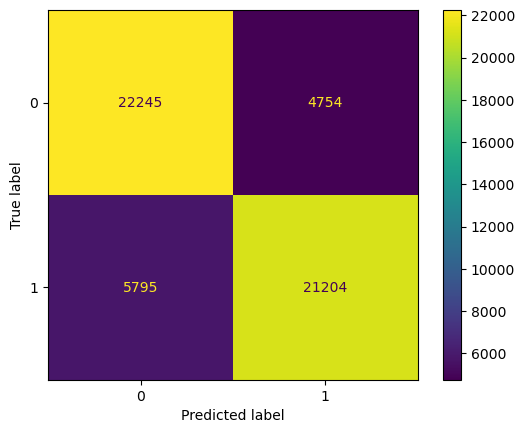

In [68]:
lr_clf_preds = lr_clf.predict(X)

# Generate array of values for confusion matrix
cm = confusion_matrix(clf_y, lr_clf_preds, labels=lr_clf.classes_)
# Plot confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr_clf.classes_).plot()

## XGBoost Classifier

In [69]:
# 1. Instantiate the XGBoost classifier
xgb_clf = XGBClassifier(objective='binary:logistic', random_state=0)

# 2. Create a dictionary of hyperparameters to tune
cv_params = {'learning_rate': [0.07,0.1,0.2],
             'max_depth': [3,4,5],
             'min_child_weight': [0.03,.05,0.08],
             'n_estimators': [200,300,400],
             }

# 3. Define a set of scoring metrics to capture
scoring = ['accuracy', 'precision', 'recall', 'f1']

# 4. Instantiate the GridSearchCV object
xgb_clf_cv = GridSearchCV(xgb_clf, cv_params, scoring=scoring, cv=custom_split, refit='f1')

In [70]:
xgb_clf_cv.fit(X_train, y_train)

GridSearchCV(cv=PredefinedSplit(test_fold=array([ 0,  0, ..., -1, -1])),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=0, ...),
             param_grid={'learning_rate': [0.07, 0.1, 0.2],
                         'max_depth': [3, 4, 5],
                         'min_child_weight': [0.03, 0.05, 0.08],
                         'n_estimators': [200, 300, 400]},
             refit='f1', scoring=['accuracy', 'precision', 'recall', 'f1'])

In [71]:
# Examine best score
xgb_clf_cv.best_score_

0.8461641630901287

In [72]:
# Get scores on test data
xgb_preds = xgb_clf_cv.best_estimator_.predict(X_test)

In [73]:
print(classification_report(y_test,xgb_preds))

              precision    recall  f1-score   support



           0       0.87      0.80      0.84      5408

           1       0.82      0.88      0.85      5392



    accuracy                           0.84     10800

   macro avg       0.84      0.84      0.84     10800

weighted avg       0.84      0.84      0.84     10800




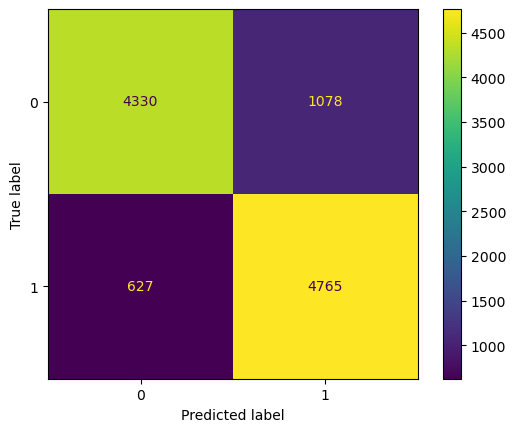

In [74]:
# Generate array of values for confusion matrix
cm = confusion_matrix(y_test, xgb_preds, labels=xgb_clf_cv.best_estimator_.classes_)
# Plot confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=xgb_clf_cv.best_estimator_.classes_).plot()

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

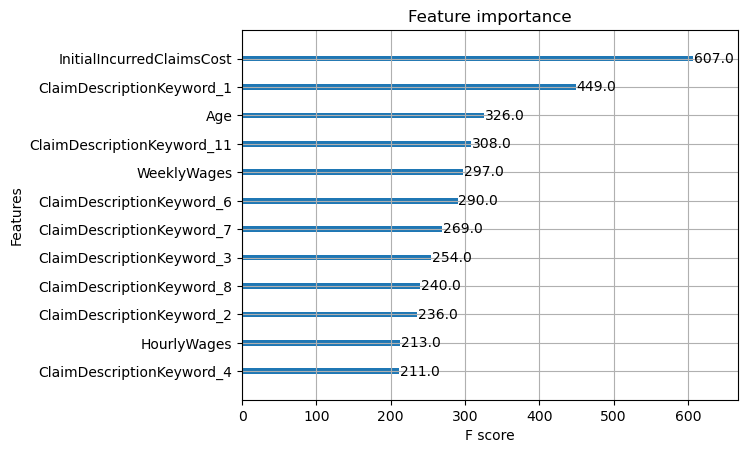

In [75]:
plot_importance(xgb_cv.best_estimator_,max_num_features=12)

### Hyperparameter tuning of XGBoost Classification

In [76]:
xgb_clf_cv.best_params_, cv_params

({'learning_rate': 0.07,
  'max_depth': 5,
  'min_child_weight': 0.03,
  'n_estimators': 300},
 {'learning_rate': [0.07, 0.1, 0.2],
  'max_depth': [3, 4, 5],
  'min_child_weight': [0.03, 0.05, 0.08],
  'n_estimators': [200, 300, 400]})

In [77]:
cv_params = {'learning_rate': [.1,.2,.3],
             'max_depth': [2,3,4],
             'min_child_weight': [.006,.01,.03],
             'n_estimators': [250,300,3500],
             }
xgb_clf_cv = GridSearchCV(xgb_clf, cv_params, scoring=scoring, cv=custom_split, refit='f1')

In [78]:
xgb_clf_cv.fit(X_train, y_train)

GridSearchCV(cv=PredefinedSplit(test_fold=array([ 0,  0, ..., -1, -1])),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=0, ...),
             param_grid={'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [2, 3, 4],
                         'min_child_weight': [0.006, 0.01, 0.03],
                         'n_estimators': [250, 300, 3500]},
             refit='f1', scoring=['accuracy', 'precision', 'recall', 'f1'])

In [79]:
# Examine best score
xgb_clf_cv.best_score_

0.84530535377993

In [80]:
# Examine best parameters
xgb_clf_cv.best_params_

{'learning_rate': 0.2,
 'max_depth': 3,
 'min_child_weight': 0.006,
 'n_estimators': 300}

In [81]:
# Get scores on test data
xgb_preds = xgb_clf_cv.best_estimator_.predict(X_test)

In [82]:
print(classification_report(y_test,xgb_preds))

              precision    recall  f1-score   support



           0       0.87      0.80      0.83      5408

           1       0.81      0.88      0.85      5392



    accuracy                           0.84     10800

   macro avg       0.84      0.84      0.84     10800

weighted avg       0.84      0.84      0.84     10800




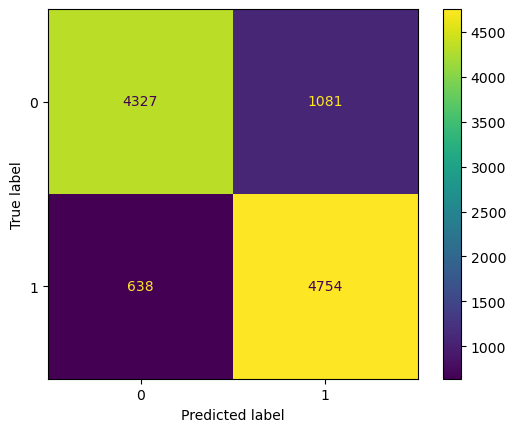

In [83]:
# Generate array of values for confusion matrix
cm = confusion_matrix(y_test,xgb_preds, labels=xgb_clf_cv.best_estimator_.classes_)
# Plot confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=xgb_clf_cv.best_estimator_.classes_).plot()

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

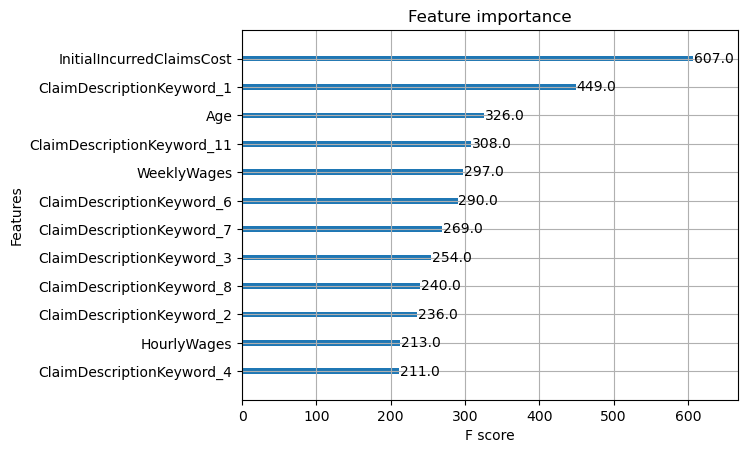

In [84]:

plot_importance(xgb_cv.best_estimator_,max_num_features=12)

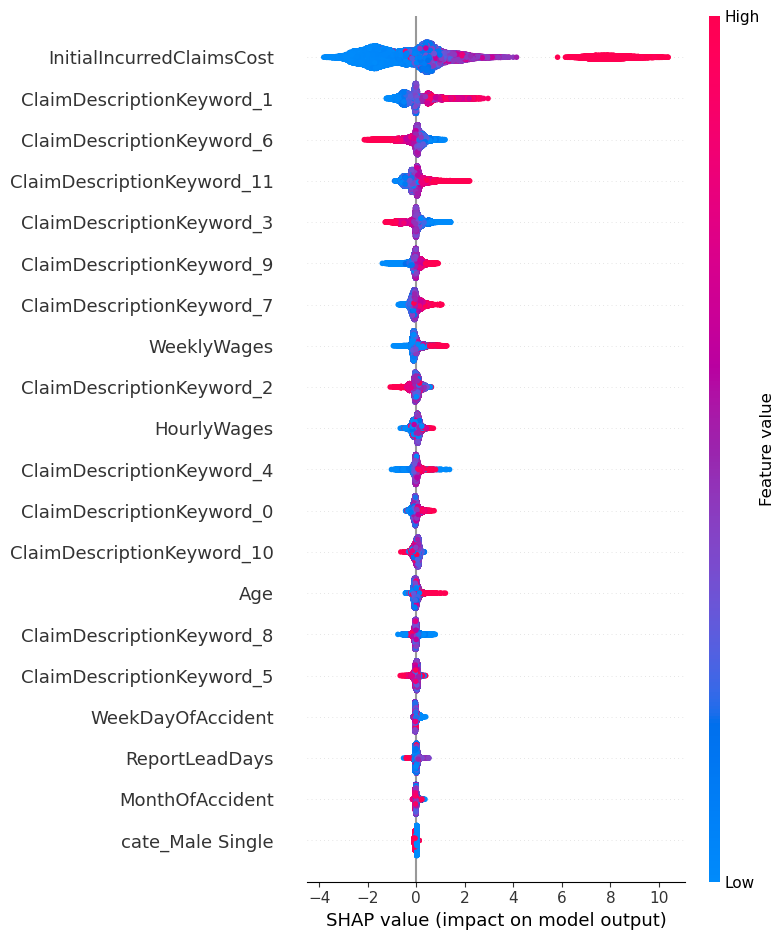

In [85]:
# Initialize the SHAP explainer
explainer = shap.Explainer(xgb_clf_cv.best_estimator_)

# Calculate SHAP values
shap_values = explainer(X)

# Displays the impact of each feature on the model output.
# Plot the SHAP values
shap.summary_plot(shap_values, X)

# pacE: **Execute**

## **Conclusion**


- Did you create any new features? If yes, can you explain the rationale behind them?

I have created new features `HourlyWages`, `DaysBetAccRep`(days between accident and report), `TimeOfAccident`, `WeekDayOfAccident`, `MonthDayOfAccident` and `MonthOfAccident`

- Which regression and classification algorithms did you choose and why?

I choose XGBoost classifier and regression algorithms, because for choosing linear models the dataset did not follow the assumptions beacause of having alot outliers, non-colinearty and unrelated, so I decided to choose tree-based algorithms in which XGBoost is the best.

- Did you try multiple algorithms? How did you compare their performance?

Linear models are not good fit for this Dataset, so I decided to choose the XGBoost algorithms only.

- Based on your models, what recommendations would you make to the business or stakeholders?
- What challenges did you encounter during the project?

The most important challenges that I encountered were making `ComplexClaims` target variable and extracting insights from dataset.

Challenges:
Data Quality: Handling missing values, ensuring data consistency.
Feature Selection: Identifying the most relevant features for the models.
Model Overfitting: Ensuring models generalize well to unseen data.


- How did you overcome these challenges?

For complex claims I decide to calculate absolute`CostDifference` between `UltimateIncurredClaimCost` and `InitialIncurredClaimCost` and its median become a threshold which is almost `1000`. 
And for insight I check the accident at specific times, days, and months with hue of different categorical values like `Gender`, `MartialStatus`, etc.


Solutions:
Imputed missing values using forward-fill strategy.
Performed EDA to understand feature relationships, used feature importances from models.
Employed cross-validation and regularization techniques to mitigate overfitting.

- What assumptions did you make during the model development process?

I assume that the XGBoost is the best way to predict and classify the data. And also I assume that `UltimateIncurredClaimCost` greater than median of `CostDifference` is `ComplexClaim`.

- What are the limitations of your models?

Model Performance: Despite tuning, models may not capture all nuances due to synthetic data.
Data Representativeness: The model's predictions are only as good as the historical data provided.